In [22]:
import pickle
import pandas as pd
import numpy as np

In [17]:
import umap  # umap-learn==0.5.3
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import cv2
import seaborn as sns

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [ ]:
from projector import projector

## Read TED embeddings

In [2]:
with open('ted_train_embs.pickle', 'rb') as f:
    ted_data = pickle.load(f)

len(ted_data)

3

In [3]:
ted_data.keys()

dict_keys(['video_embs', 'imu_embs', 'files'])

In [4]:
ds = pd.DataFrame(ted_data['files'])
ds.columns = ['chunk_path', 'kpts_path']
ds['glob_id'] = ds.index
ds['video_id'] = ds.chunk_path.apply(lambda x: x.split('/')[2])
ds['chunk_name'] = ds.chunk_path.apply(lambda x: x.split('/')[4].replace('.mp4', ''))
ds['clip_id'] = ds['chunk_name'].apply(lambda x: int(x.split('_')[0]))
ds['chunk_id'] = ds['chunk_name'].apply(lambda x: int(x.split('_')[-1]))

ds.head()

,chunk_path,kpts_path,glob_id,video_id,chunk_name,clip_id,chunk_id
0,.datasets/avatar/aR5N2Jl8k14/video/15_1.mp4,.datasets/avatar/aR5N2Jl8k14/kpts/15_1.pickle,0,aR5N2Jl8k14,15_1,15,1
1,.datasets/avatar/aR5N2Jl8k14/video/4_1.mp4,.datasets/avatar/aR5N2Jl8k14/kpts/4_1.pickle,1,aR5N2Jl8k14,4_1,4,1
2,.datasets/avatar/aR5N2Jl8k14/video/19_1.mp4,.datasets/avatar/aR5N2Jl8k14/kpts/19_1.pickle,2,aR5N2Jl8k14,19_1,19,1
3,.datasets/avatar/aR5N2Jl8k14/video/20_0.mp4,.datasets/avatar/aR5N2Jl8k14/kpts/20_0.pickle,3,aR5N2Jl8k14,20_0,20,0
4,.datasets/avatar/aR5N2Jl8k14/video/3_0.mp4,.datasets/avatar/aR5N2Jl8k14/kpts/3_0.pickle,4,aR5N2Jl8k14,3_0,3,0


In [295]:
ds.shape, ds.video_id.nunique()

((16534, 7), 405)

In [5]:
ds.groupby('video_id').agg({'clip_id': 'nunique','chunk_id': 'count'}).sort_values(['clip_id', 'chunk_id'], ascending=False).head(15)

,clip_id,chunk_id
video_id,,
ARb2UfDgSHQ,51,75
0gks6ceq4eQ,46,89
5foou7mIA0w,46,73
85hbMtegrLc,42,73
aSL-iIskEFU,41,148
2j00U6lUC-c,40,92
2BVSEnJte84,39,130
7n9IOH0NvyY,39,99
8rZzHkpyPkc,39,58


In [6]:
# exceptions
few_people = ['aSL-iIskEFU',]

In [7]:
# video for analysis
video_ids = ['0gks6ceq4eQ', '5foou7mIA0w', '85hbMtegrLc', '2j00U6lUC-c', '2BVSEnJte84', '7n9IOH0NvyY']

## Clusters per actor

In [8]:
from datasets.avatar import load_kpts

/usr/local/lib/python3.8/dist-packages/torchvision/transforms/_functional_video.py:6: UserWarning: The 'torchvision.transforms._functional_video' module is deprecated since 0.12 and will be removed in the future. Please use the 'torchvision.transforms.functional' module instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/transforms/_transforms_video.py:22: UserWarning: The 'torchvision.transforms._transforms_video' module is deprecated since 0.12 and will be removed in the future. Please use the 'torchvision.transforms' module instead.
  warnings.warn(


### 2BVSEnJte84 (Woman)

In [29]:
actor_df = ds[ds.video_id == '2BVSEnJte84'].copy()
actor_df.shape

(130, 7)

In [26]:
actor_video_embs = []
for i in actor_df.glob_id.values:
    actor_video_embs.append(ted_data['video_embs'][i])
actor_video_embs = np.vstack(actor_video_embs)

actor_imu_embs = []
for i in actor_df.glob_id.values:
    actor_imu_embs.append(ted_data['imu_embs'][i])
actor_imu_embs = np.vstack(actor_imu_embs)

len(actor_video_embs), len(actor_imu_embs)

(130, 130)

In [13]:
len(actor_df)

130

In [14]:
# raw kpts
raw_kpts = []
for i in actor_df.kpts_path.values:
    kpts = load_kpts(i, interpolate=False)
    raw_kpts.append(kpts)
len(raw_kpts), kpts.shape

(130, (100, 30, 2))

### Build clusters

#### video

In [27]:
actor_video_embs.shape

(130, 1024)

In [30]:
# Video embs
reducer = umap.UMAP(densmap=True)
cords = reducer.fit_transform(actor_video_embs)

actor_df['x'] = [i[0] for i in cords]
actor_df['y'] = [i[1] for i in cords]

<Axes: title={'center': 'Actor'}, xlabel='x', ylabel='y'>

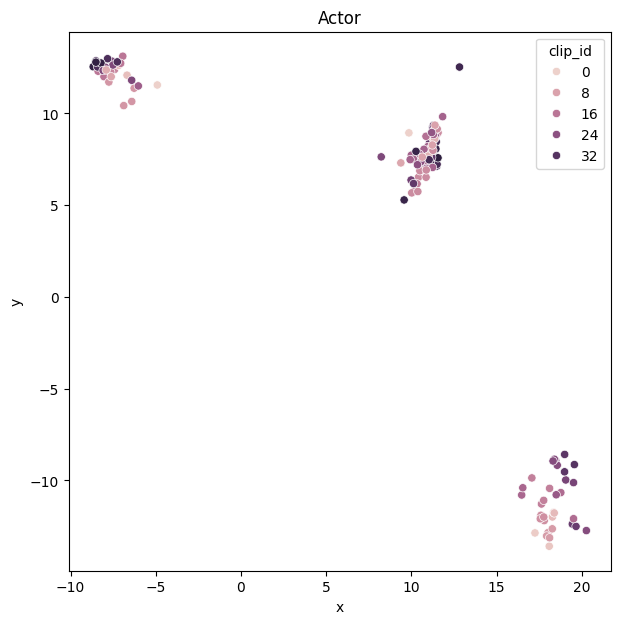

In [33]:
# Actors
fig = plt.figure(figsize=(7, 7))
plt.title('Actor')
sns.scatterplot(actor_df, x='x', y='y', hue='clip_id')

In [39]:
# Resize images for cluster visualization in bokeh
base = '/home/coder/project/.datasets/avatar'

imgs = []
for i in actor_df.chunk_path.values:
    cap = cv2.VideoCapture(i)
    while(cap.isOpened()):
        ret,img = cap.read()
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        break
    imgs.append(img)
    cap.release()

In [43]:
thumb_size = 96
plot_size = 600
labels = actor_df.clip_id.values

# bokeh umap visualization
projector(actor_video_embs, labels=labels, images=imgs, image_size=thumb_size, plot_size=plot_size, save_file=False)

perfoming projection using UMAP


generating diplayabe images:   0%|          | 0/130 [00:00<?, ?it/s]

Loading BokehJS ...

Loading BokehJS ...

#### kpts

In [45]:
thumb_size = 96
plot_size = 600
labels = actor_df.chunk_name.values

# bokeh umap visualization
projector(actor_imu_embs, labels=labels, images=imgs, image_size=thumb_size, plot_size=plot_size, save_file=False)

perfoming projection using UMAP


generating diplayabe images:   0%|          | 0/130 [00:00<?, ?it/s]

Loading BokehJS ...

Loading BokehJS ...

In [76]:
from IPython.display import Video, HTML
from base64 import b64encode 
import os

In [103]:
with open('/home/coder/project/TED_clips_DS/ted_ds_meta.pickle', 'rb') as f:
    clips_meta = pickle.load(f)
clips_meta = pd.DataFrame(clips_meta)
clips_meta.head()

,video_id,fps,clip_id,start_frame_no,end_frame_no
0,GtXyGFMBWBs,24.0,0,894,1187
1,GtXyGFMBWBs,24.0,1,2038,2367
2,GtXyGFMBWBs,24.0,2,3257,3469
3,GtXyGFMBWBs,24.0,3,3469,3851
4,GtXyGFMBWBs,24.0,4,3851,4067


In [179]:
def get_chunk_text(video_id, clip_id, chunk_id, chunk_size=100, clips_meta=clips_meta):
    base = 'TED_clips_DS/clips_ds'
    txt_path = os.path.join(base, video_id, 'text', str(clip_id)) + '.pickle'
    with open(txt_path, 'rb') as f:
        txt_data = pickle.load(f)
    
    # fps = clips_meta[(clips_meta.video_id == actor) & (clips_meta.clip_id == clip_id)].fps.item()
    _clip_meta = clips_meta[(clips_meta.video_id == actor) & (clips_meta.clip_id == clip_id)]
    time_shift = _clip_meta.start_frame_no.item()
    clip_duration = _clip_meta.end_frame_no.item() - _clip_meta.start_frame_no.item()

    txt_df = pd.DataFrame(txt_data)
    txt_df.columns = ['word', 'start_frame', 'end_frame']
    txt_df['start_frame'] -= time_shift
    txt_df['end_frame'] -= time_shift

    delta = 8 # frames
    cunks = np.arange(0, clip_duration+1, chunk_size)

    start = cunks[chunk_id]
    end = start + chunk_size + delta
    # print(f'from: {start}, to: {end}')
    txt = txt_df[(txt_df.start_frame >= start-delta) & (txt_df.start_frame <= end)]['word'].values
    
    return ' '.join(txt)

In [187]:
# Show me similar video

actor = '2BVSEnJte84'
fname = '5_0.mp4'
clip_id = int(fname.split('_')[0])
chunk_id = int(fname.split('_')[-1].replace('.mp4', ''))
glob_id = ds.loc[(ds.video_id == actor) & (ds.chunk_name == fname.split('.')[0]), 'glob_id'].values[0]
v_path = os.path.join(base, actor, 'video', fname)
clip_emb = ted_data['video_embs'][glob_id]
imu_emb = ted_data['imu_embs'][glob_id]
txt = get_chunk_text(actor, clip_id, chunk_id=chunk_id, chunk_size=100, clips_meta=clips_meta)
print(txt)
Video(v_path)

so it just honestly never even occurred to me that i would be prevented from doing anything in my life


In [188]:
actor_imu_embs.shape, actor_df.shape

((130, 1024), (130, 9))

In [194]:
# Find similar videos by kpts vectors similarity

k = 5
imu_dst = pairwise_distances(imu_emb, actor_imu_embs, metric='cosine')
topk_ids = imu_dst.argsort()[0][:k]
topk = {i:v for i,v in zip(topk_ids, imu_dst[0][topk_ids])}

filepaths = []
vis = {}
for i in topk:
    glob_id = actor_df.glob_id.values[i]
    chunk_path = actor_df[actor_df.glob_id == glob_id].chunk_path.item()
    filepaths.append(chunk_path)
    vis[actor_df.chunk_name.values[i]] = topk[i]

print(vis)
for j in vis:
  clip_id = int(j.split('_')[0])
  chunk_id = int(j.split('_')[-1])
  txt = get_chunk_text(actor, clip_id, chunk_id=chunk_id, chunk_size=100, clips_meta=clips_meta)
  print(f'Chunk: {j}, text: {txt}')

html_str=""

for filepath in filepaths:
  mp4 = open(filepath,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  html_str += """
  <video width=320 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url
HTML(html_str)

{'5_0': 1.7881393e-07, '20_7': 0.01406312, '5_4': 0.014704108, '20_0': 0.019939303, '23_0': 0.020255506}
Chunk: 5_0, text: so it just honestly never even occurred to me that i would be prevented from doing anything in my life
Chunk: 20_7, text: now please dont worry i promise you here now
Chunk: 5_4, text: i came here to play smart willful complicated interesting complex
Chunk: 20_0, text: so it is beginning to occur to me that waiting
Chunk: 23_0, text: well maybe women just arent as good at directing movies and thats not


In [191]:
# Find unsimilar videos by kpts vectors similarity

k = 5
imu_dst = pairwise_distances(imu_emb, actor_imu_embs, metric='cosine')
topk_ids = imu_dst.argsort()[0][-k:]
topk = {i:v for i,v in zip(topk_ids, imu_dst[0][topk_ids])}

filepaths = []
vis = {}
for i in topk:
    glob_id = actor_df.glob_id.values[i]
    chunk_path = actor_df[actor_df.glob_id == glob_id].chunk_path.item()
    filepaths.append(chunk_path)
    vis[actor_df.chunk_name.values[i]] = topk[i]

print(vis)

html_str=""

for filepath in filepaths:
  mp4 = open(filepath,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  html_str += """
  <video width=320 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url
HTML(html_str)

{'10_2': 0.6564323, '16_3': 0.65822935, '16_0': 0.6894639, '6_0': 0.69875205, '2_0': 0.7378795}


In [192]:
# Find similar videos by video vectors similarity

k = 5
dst = pairwise_distances(clip_emb, actor_video_embs, metric='cosine')
topk_ids = dst.argsort()[0][:k]
topk = {i:v for i,v in zip(topk_ids, dst[0][topk_ids])}

filepaths = []
vis = {}
for i in topk:
    glob_id = actor_df.glob_id.values[i]
    chunk_path = actor_df[actor_df.glob_id == glob_id].chunk_path.item()
    filepaths.append(chunk_path)
    vis[actor_df.chunk_name.values[i]] = topk[i]

print(vis)

html_str=""

for filepath in filepaths:
  mp4 = open(filepath,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  html_str += """
  <video width=320 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url
HTML(html_str)

{'5_0': 2.9802322e-07, '5_4': 0.00680089, '20_2': 0.0094255805, '8_0': 0.009956002, '30_0': 0.010061026}


In [193]:
# Find unsimilar videos by video vectors similarity

k = 5
dst = pairwise_distances(clip_emb, actor_video_embs, metric='cosine')
topk_ids = dst.argsort()[0][-k:]
topk = {i:v for i,v in zip(topk_ids, dst[0][topk_ids])}

filepaths = []
vis = {}
for i in topk:
    glob_id = actor_df.glob_id.values[i]
    chunk_path = actor_df[actor_df.glob_id == glob_id].chunk_path.item()
    filepaths.append(chunk_path)
    vis[actor_df.chunk_name.values[i]] = topk[i]

print(vis)

html_str=""

for filepath in filepaths:
  mp4 = open(filepath,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  html_str += """
  <video width=320 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url
HTML(html_str)

{'33_0': 0.51877165, '37_0': 0.51897967, '16_0': 0.5242406, '33_1': 0.5426935, '37_1': 0.5692643}


## Raw_kpts to vector

In [200]:
kpt_ids = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

In [196]:
actor_df

,chunk_path,kpts_path,glob_id,video_id,chunk_name,clip_id,chunk_id,x,y
810,.datasets/avatar/2BVSEnJte84/video/31_1.mp4,.datasets/avatar/2BVSEnJte84/kpts/31_1.pickle,810,2BVSEnJte84,31_1,31,1,18.993437,-8.581215
811,.datasets/avatar/2BVSEnJte84/video/37_0.mp4,.datasets/avatar/2BVSEnJte84/kpts/37_0.pickle,811,2BVSEnJte84,37_0,37,0,-8.673507,12.548127
812,.datasets/avatar/2BVSEnJte84/video/15_1.mp4,.datasets/avatar/2BVSEnJte84/kpts/15_1.pickle,812,2BVSEnJte84,15_1,15,1,10.232719,5.846875
813,.datasets/avatar/2BVSEnJte84/video/4_1.mp4,.datasets/avatar/2BVSEnJte84/kpts/4_1.pickle,813,2BVSEnJte84,4_1,4,1,18.272835,-11.988726
814,.datasets/avatar/2BVSEnJte84/video/29_0.mp4,.datasets/avatar/2BVSEnJte84/kpts/29_0.pickle,814,2BVSEnJte84,29_0,29,0,19.442080,-12.375589
...,...,...,...,...,...,...,...,...,...
935,.datasets/avatar/2BVSEnJte84/video/9_3.mp4,.datasets/avatar/2BVSEnJte84/kpts/9_3.pickle,935,2BVSEnJte84,9_3,9,3,18.109959,-13.122802
936,.datasets/avatar/2BVSEnJte84/video/8_3.mp4,.datasets/avatar/2BVSEnJte84/kpts/8_3.pickle,936,2BVSEnJte84,8_3,8,3,10.638728,7.623806
937,.datasets/avatar/2BVSEnJte84/video/12_1.mp4,.datasets/avatar/2BVSEnJte84/kpts/12_1.pickle,937,2BVSEnJte84,12_1,12,1,10.871162,6.921594
938,.datasets/avatar/2BVSEnJte84/video/14_2.mp4,.datasets/avatar/2BVSEnJte84/kpts/14_2.pickle,938,2BVSEnJte84,14_2,14,2,18.109262,-10.430217


In [197]:
fname = '5_0.mp4'
clip_id = int(fname.split('_')[0])
chunk_id = int(fname.split('_')[-1].replace('.mp4', ''))

In [230]:
actor_df['_ind'] = np.arange(len(actor_df))

In [202]:
# raw kpts
raw_kpts = []
for i in actor_df.kpts_path.values:
    kpts = load_kpts(i, interpolate=False)
    raw_kpts.append(kpts[:,kpt_ids,:])
len(raw_kpts), raw_kpts[0].shape

(130, (100, 11, 2))

In [232]:
chunk = actor_df[(actor_df.clip_id == clip_id) & (actor_df.chunk_id == chunk_id)]
chunk

,chunk_path,kpts_path,glob_id,video_id,chunk_name,clip_id,chunk_id,x,y,kpts_x,kpts_y,_ind
898,.datasets/avatar/2BVSEnJte84/video/5_0.mp4,.datasets/avatar/2BVSEnJte84/kpts/5_0.pickle,898,2BVSEnJte84,5_0,5,0,11.376171,9.100702,3.168689,1.807552,88


In [221]:
# step average
m = raw_kpts[0]
_m = m.reshape(20, 5, 11, 2).mean(axis=1)
_m.shape

(20, 11, 2)

In [240]:
100 / 10

10.0

In [259]:
step = 10
avr_kpts = []
for m in raw_kpts:
    _m = m.reshape(int(len(m)/step), step, 11, 2).mean(axis=1)
    avr_kpts.append(_m)
len(avr_kpts), avr_kpts[0].shape

(130, (10, 11, 2))

In [260]:
kpts_embs = []
for i in avr_kpts:
    kpts_embs.append(i.flatten())
kpts_embs = np.vstack(kpts_embs)
kpts_embs.shape

(130, 220)

In [261]:
reducer = umap.UMAP(densmap=True)
cords = reducer.fit_transform(kpts_embs)

actor_df['kpts_x'] = [i[0] for i in cords]
actor_df['kpts_y'] = [i[1] for i in cords]

<Axes: title={'center': 'Actor'}, xlabel='kpts_x', ylabel='kpts_y'>

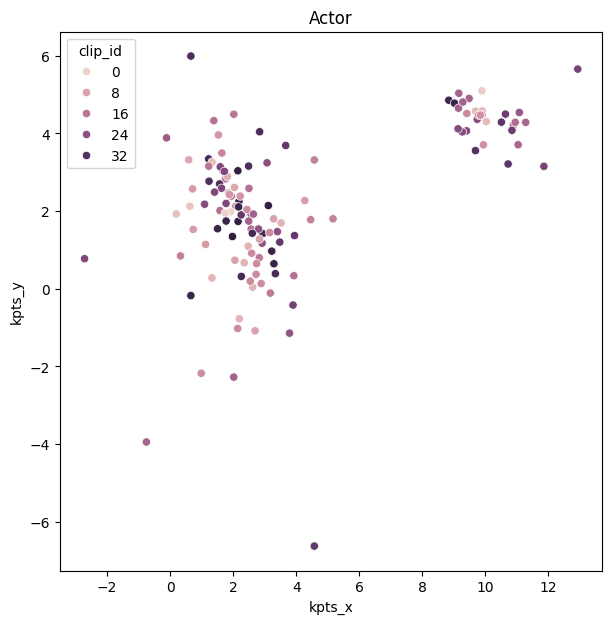

In [262]:
fig = plt.figure(figsize=(7, 7))
plt.title('Actor')
sns.scatterplot(actor_df, x='kpts_x', y='kpts_y', hue='clip_id')

In [263]:
thumb_size = 96
plot_size = 600
labels = actor_df.chunk_name.values

# bokeh umap visualization
projector(kpts_embs, labels=labels, images=imgs, image_size=thumb_size, plot_size=plot_size, save_file=False)

perfoming projection using UMAP


generating diplayabe images:   0%|          | 0/130 [00:00<?, ?it/s]

Loading BokehJS ...

Loading BokehJS ...

In [264]:
# Find similar videos by video vectors similarity
clip_emb = kpts_embs[chunk._ind.item()].reshape(1,-1)
k = 5
dst = pairwise_distances(clip_emb, kpts_embs, metric='cosine')
topk_ids = dst.argsort()[0][:k]
topk = {i:v for i,v in zip(topk_ids, dst[0][topk_ids])}

filepaths = []
vis = {}
for i in topk:
    glob_id = actor_df.glob_id.values[i]
    chunk_path = actor_df[actor_df.glob_id == glob_id].chunk_path.item()
    filepaths.append(chunk_path)
    vis[actor_df.chunk_name.values[i]] = topk[i]

print(vis)

html_str=""

for filepath in filepaths:
  mp4 = open(filepath,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  html_str += """
  <video width=320 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url
HTML(html_str)

{'5_0': 0.0, '12_5': 0.22199834538201135, '36_7': 0.2274787997068468, '34_0': 0.23948759898313654, '23_0': 0.24361110131327557}


In [253]:
# Find unsimilar videos by video vectors similarity

k = 5
dst = pairwise_distances(clip_emb, kpts_embs, metric='cosine')
topk_ids = dst.argsort()[0][-k:]
topk = {i:v for i,v in zip(topk_ids, dst[0][topk_ids])}

filepaths = []
vis = {}
for i in topk:
    glob_id = actor_df.glob_id.values[i]
    chunk_path = actor_df[actor_df.glob_id == glob_id].chunk_path.item()
    filepaths.append(chunk_path)
    vis[actor_df.chunk_name.values[i]] = topk[i]

print(vis)

html_str=""

for filepath in filepaths:
  mp4 = open(filepath,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  html_str += """
  <video width=320 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url
HTML(html_str)

{'27_0': 0.9201091868388787, '31_0': 0.930658501170482, '27_1': 0.9371076821925052, '20_3': 0.9670543184339685, '35_0': 0.9873087567982877}


## Original img_bind

In [274]:
orig_embs = np.load('/home/coder/project/original_imgbind/avatar_embs_original_ted_chunks.npy')
orig_embs.shape

(16534, 1024)

In [266]:
with open('/home/coder/project/original_imgbind/avatar_original_ted_chunks.pickl', 'rb') as f:
    orig_meta = pickle.load(f)
len(orig_meta)

16534

In [267]:
orig_meta[0]

'/media/storage/datasets/youtube-gesture-dataset/TED_chunks_DS/chunks_ds/3zJHwOwirjA/video/12_1.mp4'

In [273]:
orig_df = pd.DataFrame(orig_meta)
orig_df.columns = ['chunk_path']
orig_df['chunk_path'] = orig_df['chunk_path'].str.replace('/media/storage/datasets/youtube-gesture-dataset/TED_chunks_DS/chunks_ds', '.datasets/avatar')
orig_df['glob_id'] = orig_df.index
orig_df['video_id'] = orig_df.chunk_path.apply(lambda x: x.split('/')[2])
orig_df['chunk_name'] = orig_df.chunk_path.apply(lambda x: x.split('/')[4].replace('.mp4', ''))
orig_df['clip_id'] = orig_df['chunk_name'].apply(lambda x: int(x.split('_')[0]))
orig_df['chunk_id'] = orig_df['chunk_name'].apply(lambda x: int(x.split('_')[-1]))

orig_df.head()

,chunk_path,glob_id,video_id,chunk_name,clip_id,chunk_id
0,.datasets/avatar/3zJHwOwirjA/video/12_1.mp4,0,3zJHwOwirjA,12_1,12,1
1,.datasets/avatar/3zJHwOwirjA/video/6_1.mp4,1,3zJHwOwirjA,6_1,6,1
2,.datasets/avatar/3zJHwOwirjA/video/16_3.mp4,2,3zJHwOwirjA,16_3,16,3
3,.datasets/avatar/3zJHwOwirjA/video/5_1.mp4,3,3zJHwOwirjA,5_1,5,1
4,.datasets/avatar/3zJHwOwirjA/video/14_1.mp4,4,3zJHwOwirjA,14_1,14,1


In [275]:
actor = '2BVSEnJte84'
actor_df = orig_df[orig_df.video_id == '2BVSEnJte84'].copy()
fname = '5_0.mp4'
clip_id = int(fname.split('_')[0])
chunk_id = int(fname.split('_')[-1].replace('.mp4', ''))

glob_id = orig_df.loc[(orig_df.video_id == actor) & (orig_df.chunk_name == fname.split('.')[0]), 'glob_id'].values[0]
v_path = os.path.join(base, actor, 'video', fname)
clip_emb = orig_embs[glob_id]

In [287]:
actor_video_embs = []
for i in actor_df.glob_id.values:
    actor_video_embs.append(orig_embs[i])
actor_video_embs = np.vstack(actor_video_embs)

In [282]:
# Resize images for cluster visualization in bokeh
base = '/home/coder/project/.datasets/avatar'

imgs = []
for i in actor_df.chunk_path.values:
    cap = cv2.VideoCapture(i)
    while(cap.isOpened()):
        ret,img = cap.read()
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        break
    imgs.append(img)
    cap.release()

In [288]:
reducer = umap.UMAP(densmap=True)
cords = reducer.fit_transform(actor_video_embs)

actor_df['x'] = [i[0] for i in cords]
actor_df['y'] = [i[1] for i in cords]

<Axes: title={'center': 'Actor'}, xlabel='x', ylabel='y'>

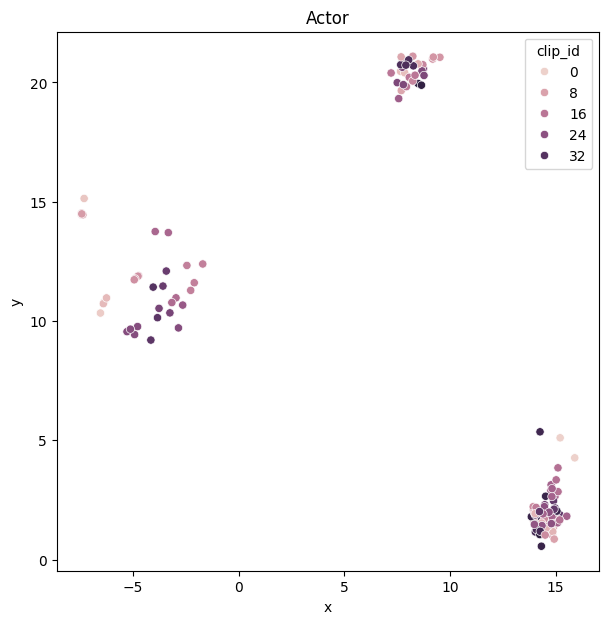

In [289]:
fig = plt.figure(figsize=(7, 7))
plt.title('Actor')
sns.scatterplot(actor_df, x='x', y='y', hue='clip_id')

In [290]:
thumb_size = 96
plot_size = 600
labels = actor_df.clip_id.values

# bokeh umap visualization
projector(actor_video_embs, labels=labels, images=imgs, image_size=thumb_size, plot_size=plot_size, save_file=False)

perfoming projection using UMAP


generating diplayabe images:   0%|          | 0/130 [00:00<?, ?it/s]

Loading BokehJS ...

Loading BokehJS ...

In [291]:
# Find similar videos by video vectors similarity

k = 5
dst = pairwise_distances(clip_emb.reshape(1,-1), actor_video_embs, metric='cosine')
topk_ids = dst.argsort()[0][:k]
topk = {i:v for i,v in zip(topk_ids, dst[0][topk_ids])}

filepaths = []
vis = {}
for i in topk:
    glob_id = actor_df.glob_id.values[i]
    chunk_path = actor_df[actor_df.glob_id == glob_id].chunk_path.item()
    filepaths.append(chunk_path)
    vis[actor_df.chunk_name.values[i]] = topk[i]

print(vis)

html_str=""

for filepath in filepaths:
  mp4 = open(filepath,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  html_str += """
  <video width=320 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url
HTML(html_str)

{'5_0': 0.0, '5_1': 0.0085181, '12_6': 0.010199785, '5_2': 0.013300538, '24_0': 0.013365626}


In [292]:
# Find unsimilar videos by video vectors similarity

k = 5
dst = pairwise_distances(clip_emb.reshape(1,-1), actor_video_embs, metric='cosine')
topk_ids = dst.argsort()[0][-k:]
topk = {i:v for i,v in zip(topk_ids, dst[0][topk_ids])}

filepaths = []
vis = {}
for i in topk:
    glob_id = actor_df.glob_id.values[i]
    chunk_path = actor_df[actor_df.glob_id == glob_id].chunk_path.item()
    filepaths.append(chunk_path)
    vis[actor_df.chunk_name.values[i]] = topk[i]

print(vis)

html_str=""

for filepath in filepaths:
  mp4 = open(filepath,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  html_str += """
  <video width=320 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url
HTML(html_str)

{'4_1': 0.40476704, '31_1': 0.41082132, '14_3': 0.4560603, '19_1': 0.45853943, '19_0': 0.4956984}
